# **LAB 4 - PART 1 Classification with KNN, Decision Tree and Random Forest**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
pd.options.display.float_format = '{:.3f}'.format

C:\Users\Kolawat\AppData\Local\Temp\ipykernel_1932\2107893204.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


#### **Read csv file**
Select only `['Total.Cup.Points', 'Species','Country.of.Origin','Processing.Method', 'Aroma', 'Flavor', 'Aftertaste','Acidity','Body', 'Balance', 'Uniformity', 'Moisture', 'altitude_mean_meters']`

In [2]:
### START CODE HERE ###
columns = ['Total.Cup.Points', 'Species', 'Country.of.Origin', 'Processing.Method', 'Aroma', 'Flavor',
           'Aftertaste', 'Acidity', 'Body', 'Balance', 'Uniformity', 'Moisture', 'altitude_mean_meters']
df = pd.read_csv('./Coffee-modified.csv', usecols=columns)

### END CODE HERE ###

In [3]:
df.columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1311 entries, 0 to 1310
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Species               1311 non-null   object 
 1   Country.of.Origin     1310 non-null   object 
 2   Processing.Method     1159 non-null   object 
 3   Aroma                 1311 non-null   float64
 4   Flavor                1311 non-null   float64
 5   Aftertaste            1311 non-null   float64
 6   Acidity               1311 non-null   float64
 7   Body                  1311 non-null   float64
 8   Balance               1311 non-null   float64
 9   Uniformity            1311 non-null   float64
 10  Total.Cup.Points      1311 non-null   float64
 11  Moisture              1311 non-null   float64
 12  altitude_mean_meters  1082 non-null   float64
dtypes: float64(10), object(3)
memory usage: 133.3+ KB


**Drop NA**


In [4]:
### START CODE HERE ###
df.dropna(inplace=True)

### END CODE HERE ###
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
Index: 1003 entries, 0 to 1309
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Species               1003 non-null   object 
 1   Country.of.Origin     1003 non-null   object 
 2   Processing.Method     1003 non-null   object 
 3   Aroma                 1003 non-null   float64
 4   Flavor                1003 non-null   float64
 5   Aftertaste            1003 non-null   float64
 6   Acidity               1003 non-null   float64
 7   Body                  1003 non-null   float64
 8   Balance               1003 non-null   float64
 9   Uniformity            1003 non-null   float64
 10  Total.Cup.Points      1003 non-null   float64
 11  Moisture              1003 non-null   float64
 12  altitude_mean_meters  1003 non-null   float64
dtypes: float64(10), object(3)
memory usage: 109.7+ KB


,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Total.Cup.Points,Moisture,altitude_mean_meters
count,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000
mean,7.567,7.514,7.386,7.526,7.504,7.499,9.870,82.127,0.095,1816.792
std,0.301,0.324,0.333,0.308,0.273,0.341,0.445,2.632,0.043,9112.473
min,5.080,6.170,6.170,5.250,6.330,6.080,6.000,59.830,0.000,1.000
25%,7.420,7.330,7.170,7.330,7.330,7.330,10.000,81.170,0.100,1100.000
50%,7.580,7.500,7.420,7.500,7.500,7.500,10.000,82.420,0.110,1310.640
75%,7.750,7.670,7.580,7.670,7.670,7.670,10.000,83.580,0.120,1600.000
max,8.750,8.830,8.670,8.750,8.500,8.580,10.000,90.580,0.170,190164.000


In [5]:
df.describe()

,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Total.Cup.Points,Moisture,altitude_mean_meters
count,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000
mean,7.567,7.514,7.386,7.526,7.504,7.499,9.870,82.127,0.095,1816.792
std,0.301,0.324,0.333,0.308,0.273,0.341,0.445,2.632,0.043,9112.473
min,5.080,6.170,6.170,5.250,6.330,6.080,6.000,59.830,0.000,1.000
25%,7.420,7.330,7.170,7.330,7.330,7.330,10.000,81.170,0.100,1100.000
50%,7.580,7.500,7.420,7.500,7.500,7.500,10.000,82.420,0.110,1310.640
75%,7.750,7.670,7.580,7.670,7.670,7.670,10.000,83.580,0.120,1600.000
max,8.750,8.830,8.670,8.750,8.500,8.580,10.000,90.580,0.170,190164.000


Let's `Y` be  `Total.Cup.Points` and X be the rest except in  `Y`.

In [6]:
### START CODE HERE ###
Y = df[['Total.Cup.Points']]
X = df.drop(['Total.Cup.Points'], axis=1)
### END CODE HERE ###

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- X : `['Species', 'Country.of.Origin', 'Processing.Method', 'Aroma', 'Flavor','Aftertaste', 'Acidity', 'Body', 'Balance', 'Uniformity', 'Moisture','altitude_mean_meters']`
- Y : `['Total.Cup.Points']`

</details>

In [7]:
print(X.columns)
print(Y.columns)

Index(['Species', 'Country.of.Origin', 'Processing.Method', 'Aroma', 'Flavor',
       'Aftertaste', 'Acidity', 'Body', 'Balance', 'Uniformity', 'Moisture',
       'altitude_mean_meters'],
      dtype='object')
Index(['Total.Cup.Points'], dtype='object')


**Labeling Bean_grade value using percentile**

- Bean_grade = 1 ; `if Y < rating_pctile[0] 75 percentile`
- Bean_grade = 2 ; `if rating_pctile[0] <= Y < rating_pctile[1] 90 percentile`
- Bean_grade = 3 ; `if Y >= rating_pctile[1]`

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>
<br>

|       |   Bean_grade |
|-------|--------------|
| count | 1003.000000  |
| mean  | 1.360917     |
| std   | 0.663677     |
| min   | 1.000000     |
| 25%   | 1.000000     |
| 50%   | 1.000000     |
| 75%   | 2.000000     |
| max   | 3.000000     |

</details>

In [8]:
### START CODE HERE ###
rating_pctile = Y.quantile([0.75, 0.90]).values

# Label the Bean_grade values
Y['Bean_grade'] = [1 if x < rating_pctile[0] else 2 if x <
                   rating_pctile[1] else 3 for x in Y['Total.Cup.Points']]

Y = Y.drop(['Total.Cup.Points'], axis=1)
### END CODE HERE ###
Y.describe()

C:\Users\Kolawat\AppData\Local\Temp\ipykernel_1932\3483358363.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y['Bean_grade'] = [1 if x < rating_pctile[0] else 2 if x <


,Bean_grade
count,1003.000
mean,1.361
std,0.664
min,1.000
25%,1.000
50%,1.000
75%,2.000
max,3.000


**Plot Bar graph that show count of each `Bean_grade`.**
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.

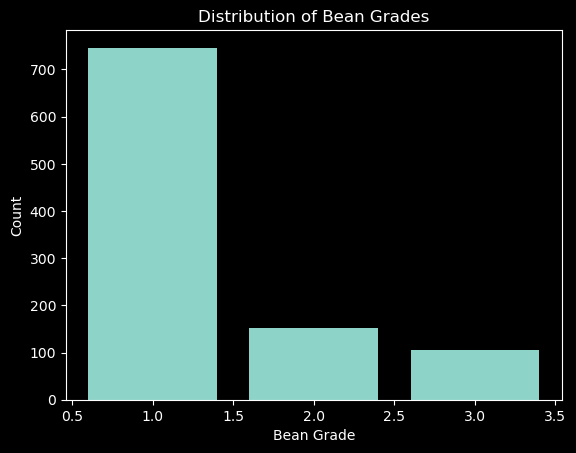

</details>

<Axes: title={'center': 'Distribution of Bean Grades'}, xlabel='Bean_grade'>

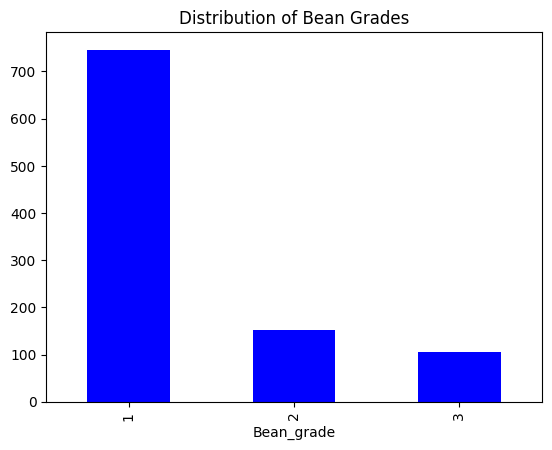

In [9]:
### START CODE HERE ###
### START CODE HERE ###
Y['Bean_grade'].value_counts().plot(
    kind='bar', title='Distribution of Bean Grades', color='blue')


### END CODE HERE ###
### END CODE HERE ###

**Standardize X's numeric data**

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.

|       |   Aroma |   Flavor |   Aftertaste |   Acidity |   Body |   Balance |   Uniformity |   Moisture |   altitude_mean_meters |
|-------|---------|----------|--------------|-----------|--------|-----------|--------------|------------|------------------------|
| count | 1003.000| 1003.000 | 1003.000     | 1003.000  | 1003.000| 1003.000  | 1003.000     | 1003.000   | 1003.000               |
| mean  | -0.000  | 0.000    | -0.000       | -0.000    | -0.000 | -0.000    | -0.000       | -0.000     | -0.000                 |
| std   | 1.000   | 1.000    | 1.000        | 1.000     | 1.000  | 1.000     | 1.000        | 1.000      | 1.000                  |
| min   | -8.258  | -4.143   | -3.655       | -7.398    | -4.306 | -4.167    | -8.694       | -2.186     | -0.199                 |
| 25%   | -0.490  | -0.567   | -0.648       | -0.638    | -0.639 | -0.497    | 0.292        | 0.115      | -0.079                 |
| 50%   | 0.042   | -0.042   | 0.103        | -0.085    | -0.016 | 0.002     | 0.292        | 0.346      | -0.056                 |
| 75%   | 0.606   | 0.482    | 0.584        | 0.467     | 0.608  | 0.501     | 0.292        | 0.576      | -0.024                 |
| max   | 3.926   | 4.058    | 3.862        | 3.978     | 3.651  | 3.173     | 0.292        | 1.727      | 20.679                 |

</details>



In [10]:
### START CODE HERE ###
standard_scaler = preprocessing.StandardScaler()
X_numeric = X.select_dtypes(include='number')
X_scaled = standard_scaler.fit_transform(X_numeric)
X[X_numeric.columns] = X_scaled
### END CODE HERE ###
X.describe()

,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Moisture,altitude_mean_meters
count,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000,1003.000
mean,-0.000,0.000,-0.000,-0.000,-0.000,-0.000,-0.000,-0.000,-0.000
std,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
min,-8.258,-4.143,-3.655,-7.398,-4.306,-4.167,-8.694,-2.186,-0.199
25%,-0.490,-0.567,-0.648,-0.638,-0.639,-0.497,0.292,0.115,-0.079
50%,0.042,-0.042,0.103,-0.085,-0.016,0.002,0.292,0.346,-0.056
75%,0.606,0.482,0.584,0.467,0.608,0.501,0.292,0.576,-0.024
max,3.926,4.058,3.862,3.978,3.651,3.173,0.292,1.727,20.679


**Drop the columns that have correlation more than 0.8.**

In [11]:
### START CODE HERE ###
### START CODE HERE ###
X_numeric = X.select_dtypes(include='number')

corr_matrix = X_numeric.corr()

dropped_columns = []

for column in corr_matrix.columns:
    correlated_features = corr_matrix.index[corr_matrix[column] > 0.8]
    for correlated_feature in correlated_features:
        if column != correlated_feature and correlated_feature not in dropped_columns:
            dropped_columns.append(correlated_feature)
X = X.drop(dropped_columns, axis=1)
print(dropped_columns)
### END CODE HERE ###

['Aftertaste', 'Flavor']


**One hot encode non-numeric columns**
<details>

<summary>
<font size="3" color="green">
<b>Hints</b>
</font>
</summary>

- `pd.get_dummies()`
</details>
<br>
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.

```
['Aroma', 'Aftertaste', 'Acidity', 'Body', 'Balance', 'Uniformity',
'Moisture', 'altitude_mean_meters', 'Country.of.Origin_Burundi',
'Country.of.Origin_China', 'Country.of.Origin_Colombia',
'Country.of.Origin_Costa Rica', 'Country.of.Origin_Cote d?Ivoire',
'Country.of.Origin_Ecuador', 'Country.of.Origin_El Salvador',
'Country.of.Origin_Ethiopia', 'Country.of.Origin_Guatemala',
'Country.of.Origin_Haiti', 'Country.of.Origin_Honduras',
'Country.of.Origin_Indonesia', 'Country.of.Origin_Japan',
'Country.of.Origin_Kenya', 'Country.of.Origin_Laos',
'Country.of.Origin_Malawi', 'Country.of.Origin_Mexico',
'Country.of.Origin_Myanmar', 'Country.of.Origin_Nicaragua',
'Country.of.Origin_Panama', 'Country.of.Origin_Papua New Guinea',
'Country.of.Origin_Peru', 'Country.of.Origin_Philippines',
'Country.of.Origin_Rwanda', 'Country.of.Origin_Taiwan',
'Country.of.Origin_Tanzania, United Republic Of',
'Country.of.Origin_Thailand', 'Country.of.Origin_Uganda',
'Country.of.Origin_United States',
'Country.of.Origin_United States (Puerto Rico)',
'Country.of.Origin_Vietnam', 'Country.of.Origin_Zambia',
'Processing.Method_Other', 'Processing.Method_Pulped natural / honey',
'Processing.Method_Semi-washed / Semi-pulped',
'Processing.Method_Washed / Wet']
```

</details>

In [12]:
### START CODE HERE ###
X = pd.get_dummies(X, drop_first=True)

### END CODE HERE ###
X.columns

Index(['Aroma', 'Acidity', 'Body', 'Balance', 'Uniformity', 'Moisture',
       'altitude_mean_meters', 'Country.of.Origin_Burundi',
       'Country.of.Origin_China', 'Country.of.Origin_Colombia',
       'Country.of.Origin_Costa Rica', 'Country.of.Origin_Cote d?Ivoire',
       'Country.of.Origin_Ecuador', 'Country.of.Origin_El Salvador',
       'Country.of.Origin_Ethiopia', 'Country.of.Origin_Guatemala',
       'Country.of.Origin_Haiti', 'Country.of.Origin_Honduras',
       'Country.of.Origin_Indonesia', 'Country.of.Origin_Japan',
       'Country.of.Origin_Kenya', 'Country.of.Origin_Laos',
       'Country.of.Origin_Malawi', 'Country.of.Origin_Mexico',
       'Country.of.Origin_Myanmar', 'Country.of.Origin_Nicaragua',
       'Country.of.Origin_Panama', 'Country.of.Origin_Papua New Guinea',
       'Country.of.Origin_Peru', 'Country.of.Origin_Philippines',
       'Country.of.Origin_Rwanda', 'Country.of.Origin_Taiwan',
       'Country.of.Origin_Tanzania, United Republic Of',
       'Country

In [13]:
### START CODE HERE ###
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.3, random_state=42)
### END CODE HERE ###

### **KNN Model Training and Testing**

- Select three values for `'n_neighbors'`.
- Train KNN models using each of the selected `'n_neighbors'` values. 
- Plot a bar graph to display the accuracy score for each `'n_neighbors'` value."
- Print `confusion_matrix` and `classification_report` of the model that have the best `accuracy_score`
<details>

<summary>
<font size="3" color="green">
<b>Hints</b>
</font>
</summary>

- `KNeighborsClassifier()`

</details>
<br>
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.

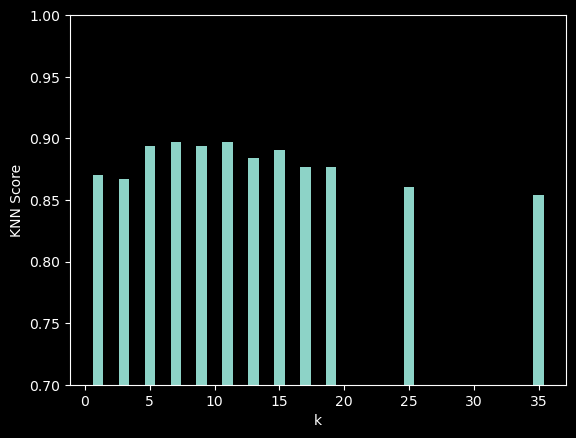

```
confusion_matrix :
 [[215   8   1]
 [ 10  36   0]
 [  0  12  19]]
classification_report :
               precision    recall  f1-score   support

           1       0.96      0.96      0.96       224
           2       0.64      0.78      0.71        46
           3       0.95      0.61      0.75        31

    accuracy                           0.90       301
   macro avg       0.85      0.79      0.80       301
weighted avg       0.91      0.90      0.90       301
```

</details>

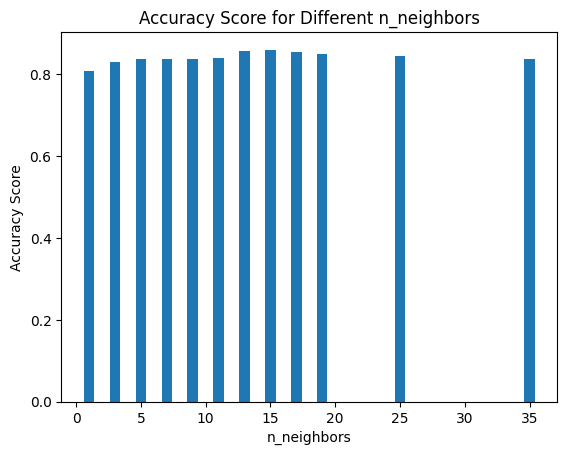

Best Accuracy Score: 0.8604651162790697
Corresponding n_neighbors value: 15
[[217   9   1]
 [ 16  22   0]
 [  2  14  20]]
              precision    recall  f1-score   support

           1       0.92      0.96      0.94       227
           2       0.49      0.58      0.53        38
           3       0.95      0.56      0.70        36

    accuracy                           0.86       301
   macro avg       0.79      0.70      0.72       301
weighted avg       0.87      0.86      0.86       301



In [14]:
### START CODE HERE ###
k = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 25, 35]

accuracy_scores = []

for n in k:
    knn = KNeighborsClassifier(n_neighbors=n)
    knn.fit(X_train, Y_train.values.ravel())
    y_pred = knn.predict(X_test)
    accuracy_scores.append(accuracy_score(Y_test, y_pred))

# Plotting the accuracy scores
plt.bar(k, accuracy_scores)
plt.xlabel('n_neighbors')
plt.ylabel('Accuracy Score')
plt.title('Accuracy Score for Different n_neighbors')
plt.show()

# Finding the best accuracy score and its corresponding n_neighbors value
best_accuracy = max(accuracy_scores)
best_n = k[accuracy_scores.index(best_accuracy)]
print(f"Best Accuracy Score: {best_accuracy}")
print(f"Corresponding n_neighbors value: {best_n}")

# Training the KNN model with the best n_neighbors value
best_knn = KNeighborsClassifier(n_neighbors=best_n)
best_knn.fit(X_train, Y_train.values.ravel())
y_pred_best = best_knn.predict(X_test)

# Printing the confusion matrix and classification report
print(confusion_matrix(Y_test, y_pred_best))
print(classification_report(Y_test, y_pred_best))



### END CODE HERE ###

### **Decision Tree Model Training and Testing**
Parameters 
- criterion = `['entropy', 'gini']`
- max_depth = `[4,5,6,None]`

Fit models with all this parameters.<br>
Then, print accuracy score of all parameter sets.<br>
Next, <font color="orange">plot the Tree, print confusion matrix and classification report</font> of best accuracy score for each criteion `entropy` and `gini`.

<details>

<summary>
<font size="3" color="green">
<b>Hints</b>
</font>
</summary>

- `DecisionTreeClassifier()`

</details>
<br>
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.

```
Accuracy is 0.8471760797342193 for criterion = entropy and max_depth = 4
...
Accuracy is 0.8504983388704319 for criterion = entropy and max_depth = None
Accuracy is 0.8504983388704319 for criterion = gini and max_depth = 4
...
Accuracy is 0.8338870431893688 for criterion = gini and max_depth = None
```



```Entropy Confusion Matrix:
 [[205  17   2]
 [ 10  30   6]
 [  1   5  25]]
Entropy Classification Report:
               precision    recall  f1-score   support

           1       0.95      0.92      0.93       224
           2       0.58      0.65      0.61        46
           3       0.76      0.81      0.78        31

    accuracy                           0.86       301
   macro avg       0.76      0.79      0.78       301
weighted avg       0.87      0.86      0.87       301

Gini Confusion Matrix:
 [[212  11   1]
 [ 18  27   1]
 [  2  12  17]]
Gini Classification Report:
               precision    recall  f1-score   support

           1       0.91      0.95      0.93       224
           2       0.54      0.59      0.56        46
           3       0.89      0.55      0.68        31

    accuracy                           0.85       301
   macro avg       0.78      0.69      0.72       301
weighted avg       0.85      0.85      0.85       301
```
</details>

Criterion: gini, Max Depth: 3, Accuracy Score: 0.8305647840531561
Criterion: gini, Max Depth: 4, Accuracy Score: 0.840531561461794
Criterion: gini, Max Depth: 5, Accuracy Score: 0.867109634551495
Criterion: gini, Max Depth: 6, Accuracy Score: 0.867109634551495
Criterion: gini, Max Depth: 10, Accuracy Score: 0.8338870431893688
Criterion: gini, Max Depth: None, Accuracy Score: 0.8305647840531561
Criterion: entropy, Max Depth: 3, Accuracy Score: 0.8338870431893688
Criterion: entropy, Max Depth: 4, Accuracy Score: 0.8637873754152824
Criterion: entropy, Max Depth: 5, Accuracy Score: 0.8538205980066446
Criterion: entropy, Max Depth: 6, Accuracy Score: 0.8637873754152824
Criterion: entropy, Max Depth: 10, Accuracy Score: 0.8205980066445183
Criterion: entropy, Max Depth: None, Accuracy Score: 0.8239202657807309
[[213  13   1]
 [ 13  21   4]
 [  1   8  27]]
Gini Classification Report :
              precision    recall  f1-score   support

           1       0.94      0.94      0.94       227
 

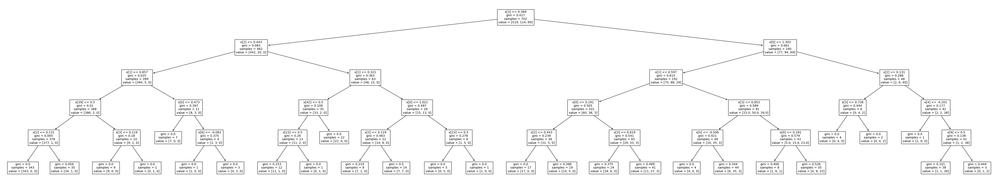

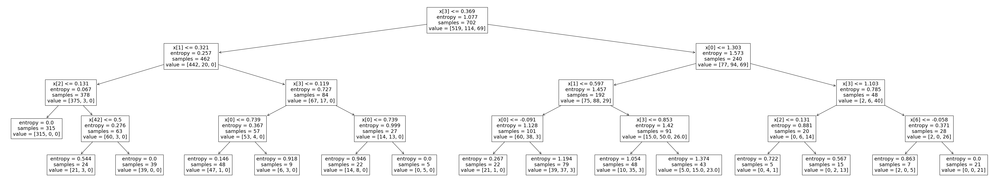

In [15]:
### START CODE HERE ###

criterion = ['gini', 'entropy']
max_depth = [3, 4, 5, 6, 10, None]

accuracy_scores = []

for c in criterion:
    for d in max_depth:
        dt = DecisionTreeClassifier(criterion=c, max_depth=d)
        dt.fit(X_train, Y_train.values.ravel())
        y_pred = dt.predict(X_test)
        accuracy_scores.append({"criterion": c, "max_depth": d, "accuracy_score": accuracy_score(Y_test, y_pred)})
        print(f"Criterion: {c}, Max Depth: {d}, Accuracy Score: {accuracy_score(Y_test, y_pred)}")

# Plotting the accuracy scores
best_gini = accuracy_scores[0:6]
best_entropy = accuracy_scores[6:12]

best_gini_params = max(best_gini, key=lambda x:x['accuracy_score'])
best_entropy_params = max(best_entropy, key=lambda x:x['accuracy_score'])

# print(f"Best Gini Accuracy Score: {best_gini_params['accuracy_score']}, Criterion: {best_gini_params['criterion']}, Max Depth: {best_gini_params['max_depth']}")
# print(f"Best Entropy Accuracy Score: {best_entropy_params['accuracy_score']}, Criterion: {best_entropy_params['criterion']}, Max Depth: {best_entropy_params['max_depth']}")

fig_gini = plt.figure(figsize=(60, 11))
tree_model_gini = DecisionTreeClassifier(criterion=best_gini_params['criterion'], max_depth=best_gini_params['max_depth'])
tree_model_gini.fit(X_train, Y_train.values.ravel())
y_pred_gini = tree_model_gini.predict(X_test)
plt.title('Decision Tree with Gini')
tree.plot_tree(tree_model_gini)

fig_entropy = plt.figure(figsize=(60, 11))
tree_model_entropy = DecisionTreeClassifier(criterion=best_entropy_params['criterion'], max_depth=best_entropy_params['max_depth']) 
tree_model_entropy.fit(X_train, Y_train.values.ravel())
y_pred_entropy = tree_model_entropy.predict(X_test)
plt.title('Decision Tree with Entropy')
tree.plot_tree(tree_model_entropy)


#gini tree
confusion_matrix_gini = confusion_matrix(Y_test, y_pred_gini)
classification_report_gini = classification_report(Y_test, y_pred_gini)
print(confusion_matrix_gini)
print(f'Gini Classification Report :\n{classification_report_gini}')


#entropy tree
confusion_matrix_entropy = confusion_matrix(Y_test, y_pred_entropy)
classification_report_entropy = classification_report(Y_test, y_pred_entropy)
print(confusion_matrix_entropy)
print(f'Entropy Classification Report :\n{classification_report_entropy}')

### END CODE HERE ###

### **Random Forest Model Training and Testing**
Parameters 
- criterion = `['entropy', 'gini']`
- n_estimators = `[10,100]`

Fit models with all this parameters.<br>
Then, print accuracy score of all parameter sets.<br>
<details>

<summary>
<font size="3" color="green">
<b>Hints</b>
</font>
</summary>

- `RandomForestClassifier()`

</details>
<br>

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.
```
Accuracy is 0.8803986710963455 for criterion = entropy and n_estimators = 10
...
```

</details>

In [16]:
### START CODE HERE ###

criterion = ['entropy', 'gini']
n_estimators = [10, 20, 50, 80, 100]

accuracy_scores = []

for c in criterion:
    for n in n_estimators:
        rf = RandomForestClassifier(criterion=c, n_estimators=n)
        rf.fit(X_train, Y_train.values.ravel())
        y_pred = rf.predict(X_test)
        accuracy_scores.append({"criterion": c, "n_estimators": n, "accuracy_score": accuracy_score(Y_test, y_pred)})
        print(f"Criterion: {c}, n_estimators: {n}, Accuracy Score: {accuracy_score(Y_test, y_pred)}")

best_params = max(accuracy_scores, key=lambda x:x['accuracy_score'])
print(f"Best Accuracy Score: {best_params['accuracy_score']}, Criterion: {best_params['criterion']}, n_estimators: {best_params['n_estimators']}")

### END CODE HERE ###

Criterion: entropy, n_estimators: 10, Accuracy Score: 0.840531561461794
Criterion: entropy, n_estimators: 20, Accuracy Score: 0.840531561461794
Criterion: entropy, n_estimators: 50, Accuracy Score: 0.8571428571428571
Criterion: entropy, n_estimators: 80, Accuracy Score: 0.8637873754152824
Criterion: entropy, n_estimators: 100, Accuracy Score: 0.867109634551495
Criterion: gini, n_estimators: 10, Accuracy Score: 0.8538205980066446
Criterion: gini, n_estimators: 20, Accuracy Score: 0.8538205980066446
Criterion: gini, n_estimators: 50, Accuracy Score: 0.8571428571428571
Criterion: gini, n_estimators: 80, Accuracy Score: 0.8604651162790697
Criterion: gini, n_estimators: 100, Accuracy Score: 0.8704318936877077
Best Accuracy Score: 0.8704318936877077, Criterion: gini, n_estimators: 100


**Print confusion matrix and classification report of best accuracy score.**
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.
```
confusion_matrix :
 [[219   4   1]
 [ 13  31   2]
 [  0  10  21]]
classification_report :
               precision    recall  f1-score   support

           1       0.94      0.98      0.96       224
           2       0.69      0.67      0.68        46
           3       0.88      0.68      0.76        31

    accuracy                           0.90       301
   macro avg       0.84      0.78      0.80       301
weighted avg       0.90      0.90      0.90       301
```

</details>

In [17]:
### START CODE HERE ###

confusion_matrix_rf = confusion_matrix(Y_test, y_pred)
classification_report_rf = classification_report(Y_test, y_pred)
print(confusion_matrix_rf)
print(f'Random Forest Classification Report :\n{classification_report_rf}')


### END CODE HERE ###

[[219   8   0]
 [ 15  21   2]
 [  3  11  22]]
Random Forest Classification Report :
              precision    recall  f1-score   support

           1       0.92      0.96      0.94       227
           2       0.53      0.55      0.54        38
           3       0.92      0.61      0.73        36

    accuracy                           0.87       301
   macro avg       0.79      0.71      0.74       301
weighted avg       0.87      0.87      0.87       301



**Plot bar graph of feature_importance of best models.**
<details>

<summary>
<font size="3" color="green">
<b>Hints</b>
</font>
</summary>

- `.feature_importances_`

</details>
<br>

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.

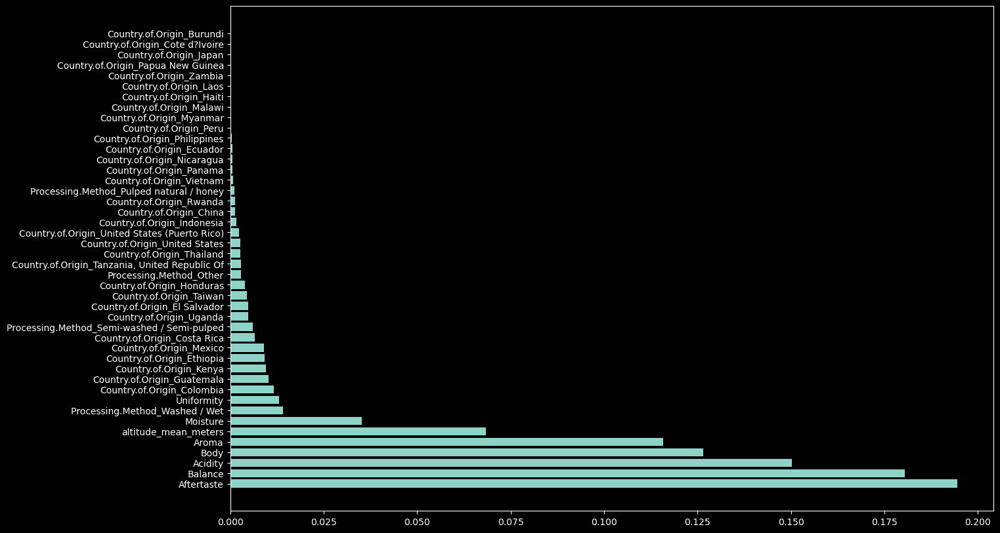


</details>

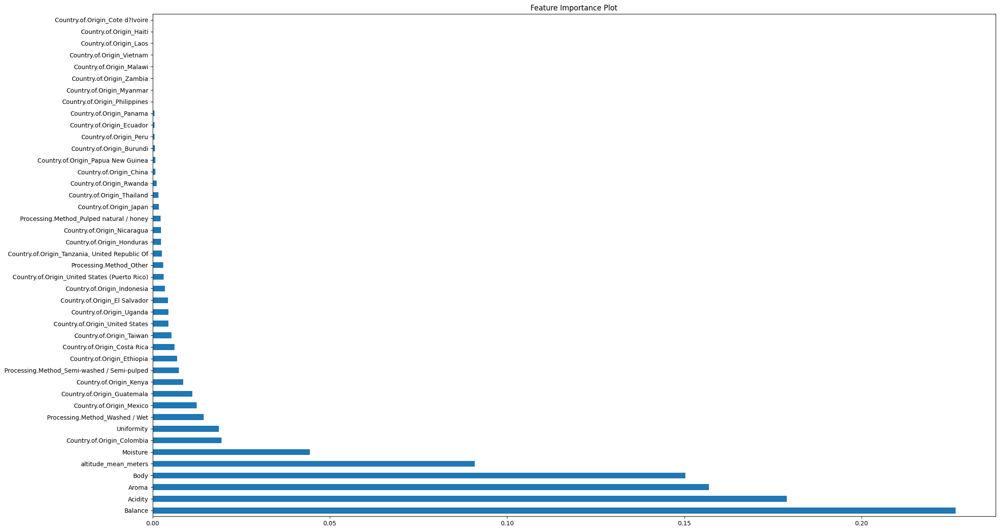

In [18]:
### START CODE HERE ###
fig = plt.figure(figsize=(25, 15))
feature_plot = pd.Series(rf.feature_importances_, index=X.columns).nlargest(len(X.columns)).plot(kind='barh')
plt.title('Feature Importance Plot')
plt.show()
### END CODE HERE ###

**Plot tree of all forest**<br>
NOTE: Please use high DPI for easier observation of the forest.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.




</details>

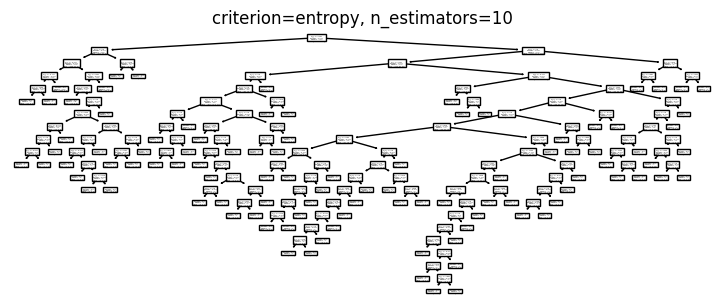

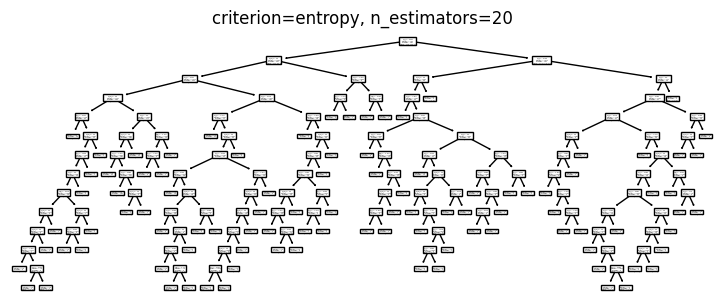

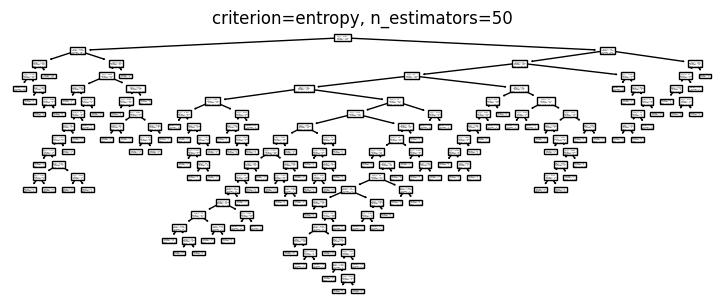

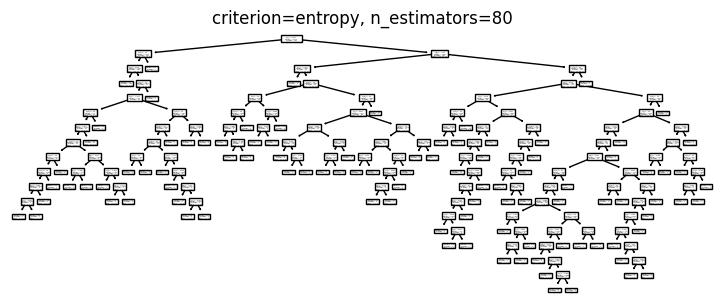

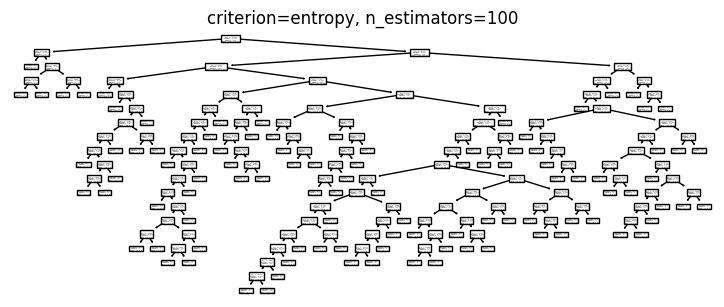

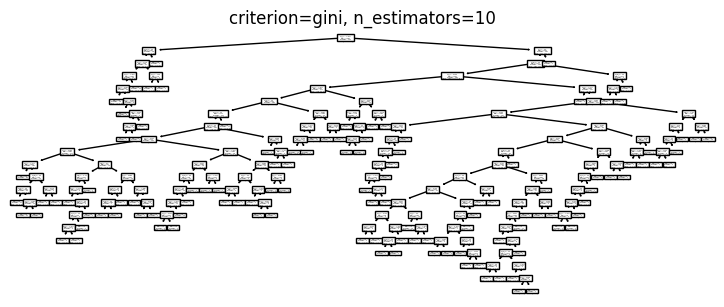

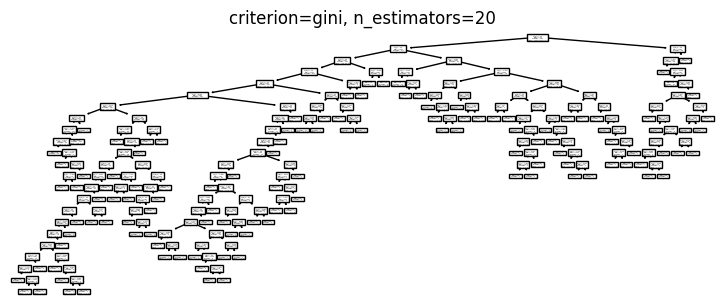

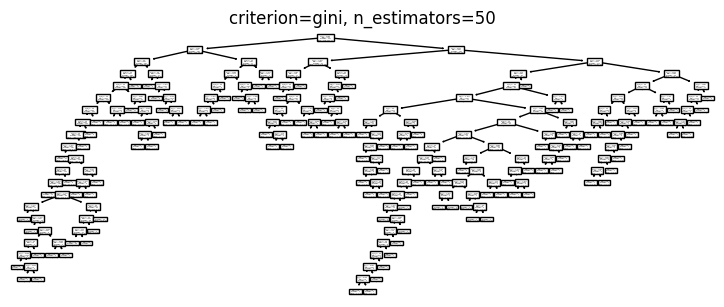

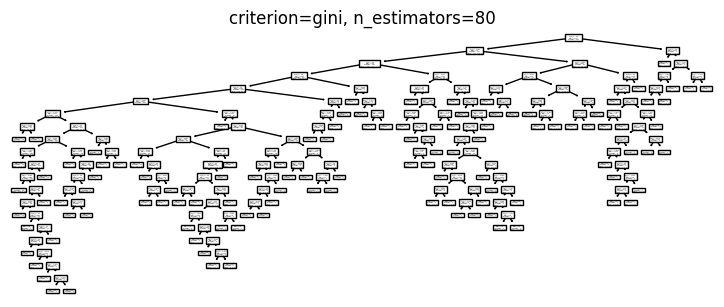

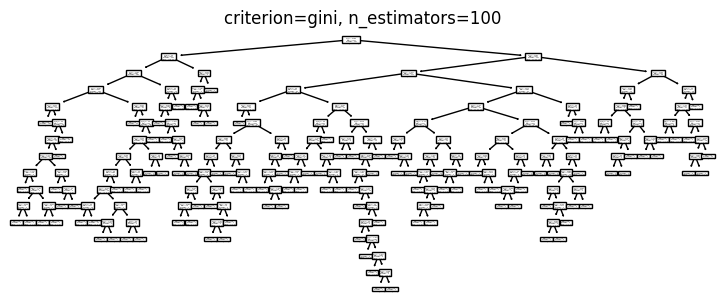

In [19]:
### START CODE HERE ###
criterion = ['entropy', 'gini']
n_estimators = [10, 20, 50, 80, 100]

for c in range(len(criterion)):
    for n in range(len(n_estimators)):
        fig = plt.figure(figsize=(20, 20))
        ax = fig.add_subplot(5, 2, c*5+n+1)
        rf = RandomForestClassifier(criterion=criterion[c], n_estimators=n_estimators[n])
        rf.fit(X_train, Y_train.values.ravel())
        tree.plot_tree(rf.estimators_[0], ax=ax)
        ax.set_title(f'criterion={criterion[c]}, n_estimators={n_estimators[n]}')
plt.show()


### END CODE HERE ###

### **MLP Training and Testing**
Parameters
 - hidden_layer_sizes = `(10,10,)`

Fit models with this parameters.<br>
Then, print accuracy score, confusion matrix and classification report.<br>
<details>

<summary>
<font size="3" color="green">
<b>Hints</b>
</font>
</summary>

- `MLPClassifier()`

</details>
<br>

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.
```
Accuracy is 0.9036544850498339
Confusion Matrix:
 [[211  13   0]
 [  6  37   3]
 [  0   7  24]]
Classification Report:
               precision    recall  f1-score   support

           1       0.97      0.94      0.96       224
           2       0.65      0.80      0.72        46
           3       0.89      0.77      0.83        31

    accuracy                           0.90       301
   macro avg       0.84      0.84      0.83       301
weighted avg       0.91      0.90      0.91       301
...
```
</details>

In [20]:
### START CODE HERE ###

hidden_layer_sizes = (10, 10,)

mlp = MLPClassifier(hidden_layer_sizes=hidden_layer_sizes, max_iter=1000)
mlp.fit(X_train, Y_train.values.ravel())
y_pred = mlp.predict(X_test)
print(f"Accuracy Score: {accuracy_score(Y_test, y_pred)}")
print(f"Confusion Matrix:\n{confusion_matrix(Y_test, y_pred)}")
print(f"Classification Report:\n{classification_report(Y_test, y_pred)}")

### END CODE HERE ###

Accuracy Score: 0.8604651162790697
Confusion Matrix:
[[212  14   1]
 [ 11  26   1]
 [  4  11  21]]
Classification Report:
              precision    recall  f1-score   support

           1       0.93      0.93      0.93       227
           2       0.51      0.68      0.58        38
           3       0.91      0.58      0.71        36

    accuracy                           0.86       301
   macro avg       0.79      0.73      0.74       301
weighted avg       0.88      0.86      0.86       301



### **Hyperparameter Tuning (GridsearchCV)**
Search space for KNN
- n_neighhbors = `[1,3,5,7,9,11,13,15,17,19,25,35,45]`

Search space for Decision Tree
- criterion = `['entropy', 'gini']`
- max_depth = `[4,5,6]`
- max_features = `['sqrt', 'log2',None]`
- min_samples_leaf = `[1,2,4]`

Search space for Random forest
- criterion = `['entropy', 'gini']`
- max_depth = `[4,5,6]`
- max_features = `['sqrt', 'log2',None]`
- min_samples_leaf = `[1,2,4]`
- n_estimators = `[10,30,50,100]`

Search space for MLP
- hidden_layer_sizes = `[(2,2,), (20,20,), (50,50,)]`
- n_iter = `[100,200,300]`

Then run grid search.

<details>

<summary>
<font size="3" color="green">
<b>Hints</b>
</font>
</summary>

- `GridSearchCV()`

</details>
<br>


In [21]:
### START CODE HERE ###

model = {
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'MLP': MLPClassifier()

}

# KNN
n_neighhbors = [1,3,5,7,9,11,13,15,17,19,25,35,45]
param_KNN = {'n_neighbors': n_neighhbors}

# Decision Tree
criterion = ['entropy', 'gini']
max_depth = [4,5,6]
max_features = ['sqrt', 'log2',None]
min_samples_leaf = [1,2,4]
param_DT = {'criterion': criterion, 'max_depth': max_depth, 'max_features': max_features, 'min_samples_leaf': min_samples_leaf}

# Random Forest
criterion = ['entropy', 'gini']
max_depth = [4,5,6]
max_features = ['sqrt', 'log2',None]
min_samples_leaf = [1,2,4]
n_estimators = [10,30,50,100]
param_RF = {'criterion': criterion, 'max_depth': max_depth, 'max_features': max_features, 'min_samples_leaf': min_samples_leaf, 'n_estimators': n_estimators}

# MLP
hidden_layer_sizes = [(2,2,), (20,20,), (50,50,)]
max_iter = [100,200,300]
param_MLP = {'hidden_layer_sizes': hidden_layer_sizes, 'max_iter': max_iter}

best_params = {
    'KNN': {},
    'Decision Tree': {},
    'Random Forest': {},
    'MLP': {}
}

best_score = {
    'KNN': 0,
    'Decision Tree': 0,
    'Random Forest': 0,
    'MLP': 0
}

for model_name, model in model.items():
    if model_name == 'KNN':
        param = param_KNN
    elif model_name == 'Decision Tree':
        param = param_DT
    elif model_name == 'Random Forest':
        param = param_RF
    else:
        param = param_MLP
        
    grid = GridSearchCV(
        estimator=model,
        param_grid=param,
        scoring='accuracy',
        verbose=3,
        n_jobs=-1)
    grid.fit(X_train, Y_train.values.ravel())
    best_params[model_name] = grid.best_params_
    best_score[model_name] = grid.best_score_
    print(f"Best Parameters for {model_name}: {grid.best_params_}")

### END CODE HERE ###

Fitting 5 folds for each of 13 candidates, totalling 65 fits
Best Parameters for KNN: {'n_neighbors': 7}
Fitting 5 folds for each of 54 candidates, totalling 270 fits
Best Parameters for Decision Tree: {'criterion': 'gini', 'max_depth': 5, 'max_features': None, 'min_samples_leaf': 4}
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Parameters for Random Forest: {'criterion': 'entropy', 'max_depth': 6, 'max_features': None, 'min_samples_leaf': 2, 'n_estimators': 100}
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best Parameters for MLP: {'hidden_layer_sizes': (20, 20), 'max_iter': 100}


c:\Users\Kolawat\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


In [22]:
for model in best_params:
    print(f"Best Parameters for {model}: {best_params[model]}")
    print(f"Best Score for {model}: {best_score[model]}")

Best Parameters for KNN: {'n_neighbors': 7}
Best Score for KNN: 0.8746808510638298
Best Parameters for Decision Tree: {'criterion': 'gini', 'max_depth': 5, 'max_features': None, 'min_samples_leaf': 4}
Best Score for Decision Tree: 0.8504457953394123
Best Parameters for Random Forest: {'criterion': 'entropy', 'max_depth': 6, 'max_features': None, 'min_samples_leaf': 2, 'n_estimators': 100}
Best Score for Random Forest: 0.8803242147922999
Best Parameters for MLP: {'hidden_layer_sizes': (20, 20), 'max_iter': 100}
Best Score for MLP: 0.8988551165146911


**Print the result of grid search.**<br>
- Best parameters of each models
- Best scores of each models
- Mean score
- std scored
- Parameters<br>

**Plot bar graph to show accuracy score of each models.**


<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.
```
Best parameters: {'n_neighbors': 9}
Best score: 0.8803444782168187
Mean cross-validated score: [0.85893617 0.85036474 0.86322188 0.87893617 0.88034448 0.87463019
 0.86751773 0.86753799 0.86895643 0.86755826 0.85758865 0.86754813
 0.86471125]
Standard deviation of cross-validated score: [0.02615339 0.02804864 0.00870862 0.01734425 0.01932745 0.01472621
 0.00729099 0.00693851 0.00838998 0.01430598 0.01142008 0.01030234
 0.01525526]
Parameters: [{'n_neighbors': 1}, {'n_neighbors': 3}, {'n_neighbors': 5}, {'n_neighbors': 7}, {'n_neighbors': 9}, {'n_neighbors': 11}, {'n_neighbors': 13}, {'n_neighbors': 15}, {'n_neighbors': 17}, {'n_neighbors': 19}, {'n_neighbors': 25}, {'n_neighbors': 35}, {'n_neighbors': 45}]
...
```

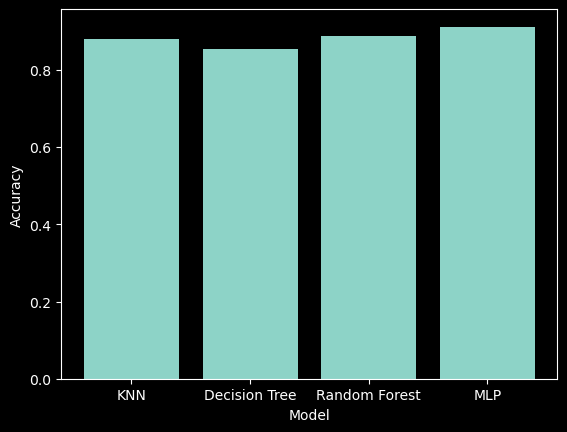
</details>

KNN
Best parameters for KNN: {'n_neighbors': 7}
Best score for KNN: 0.8988551165146911
Mean Score for KNN: [0.49361702 0.78492401 0.83907801 0.89885512 0.88746707 0.88460993
 0.88888551 0.86749747 0.86178318]
std Score for KNN: [0.29863151 0.02742171 0.02663191 0.01145666 0.01521828 0.00837755
 0.01605202 0.01488081 0.01503556]
Params for KNN: [{'hidden_layer_sizes': (2, 2), 'max_iter': 100}, {'hidden_layer_sizes': (2, 2), 'max_iter': 200}, {'hidden_layer_sizes': (2, 2), 'max_iter': 300}, {'hidden_layer_sizes': (20, 20), 'max_iter': 100}, {'hidden_layer_sizes': (20, 20), 'max_iter': 200}, {'hidden_layer_sizes': (20, 20), 'max_iter': 300}, {'hidden_layer_sizes': (50, 50), 'max_iter': 100}, {'hidden_layer_sizes': (50, 50), 'max_iter': 200}, {'hidden_layer_sizes': (50, 50), 'max_iter': 300}]
------------------------------------------------------------------------------------------------------------------------------------------------------
Decision Tree
Best parameters for Decision Tree: 

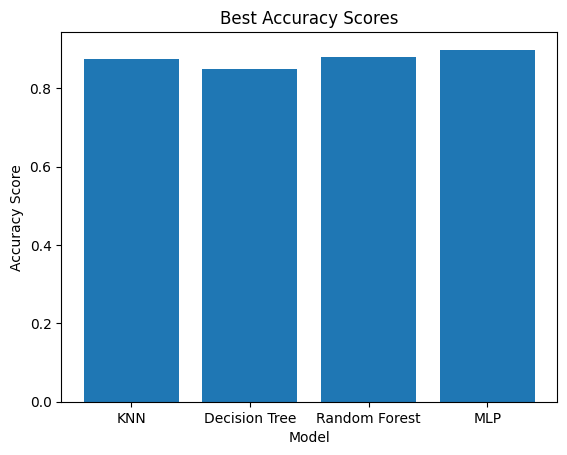

In [23]:
### START CODE HERE ###

for model_name, model in best_params.items():
    print(f'{model_name}')
    print(f'Best parameters for {model_name}: {model}')
    print(f'Best score for {model_name}: {grid.best_score_}')
    print(f'Mean Score for {model_name}: {grid.cv_results_["mean_test_score"]}')
    print(f'std Score for {model_name}: {grid.cv_results_["std_test_score"]}')
    print(f'Params for {model_name}: {grid.cv_results_["params"]}')
    print('-'*150)

# Extract the model names and accuracy scores
model_names = list(best_score.keys())
accuracy_scores = list(best_score.values())

# Plot the bar graph
plt.bar(model_names, accuracy_scores)
plt.xlabel('Model')
plt.ylabel('Accuracy Score')
plt.title('Best Accuracy Scores')
plt.show()


### END CODE HERE ###

**Plot the confusion matrix for each model's best parameters.**
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical.

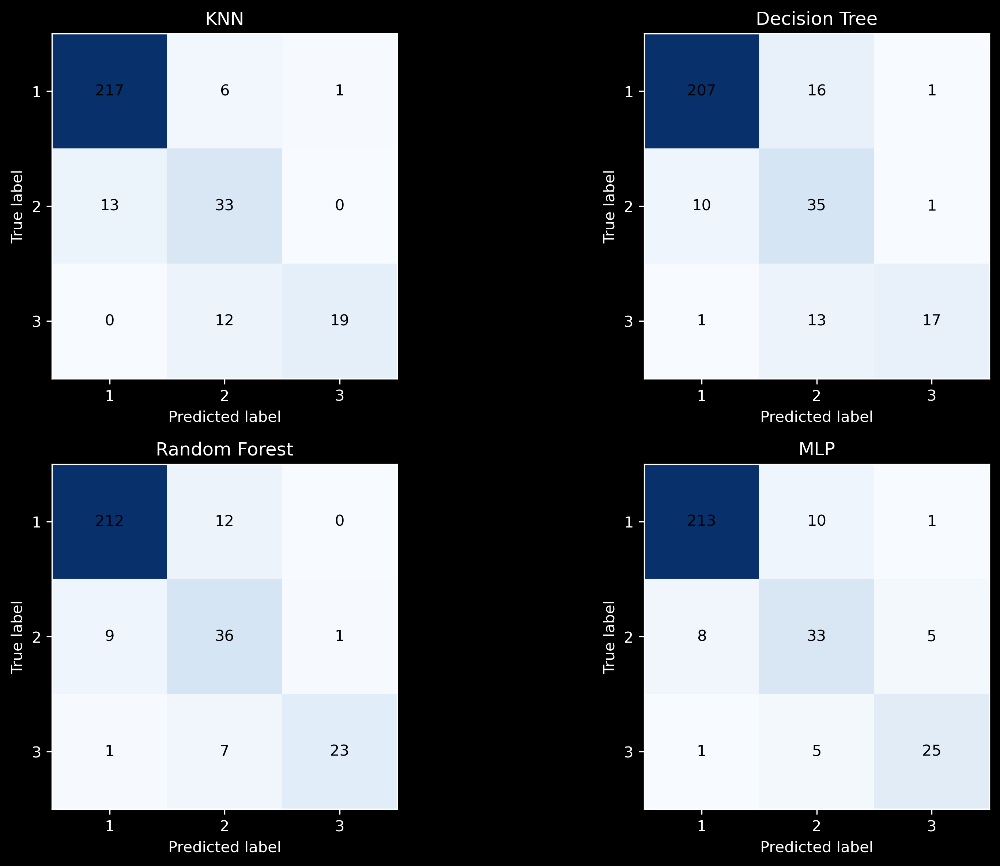


</details>

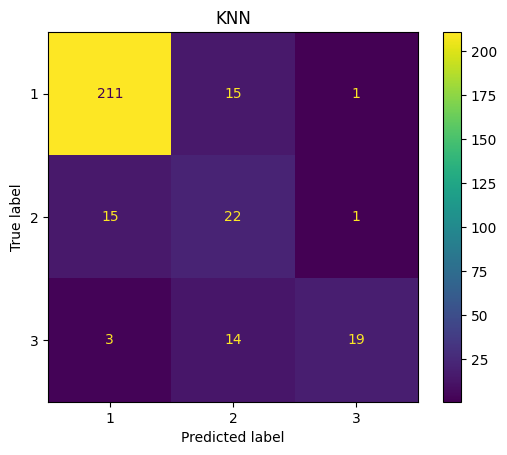

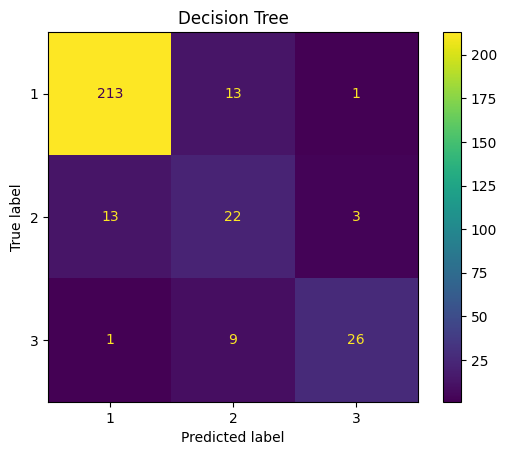

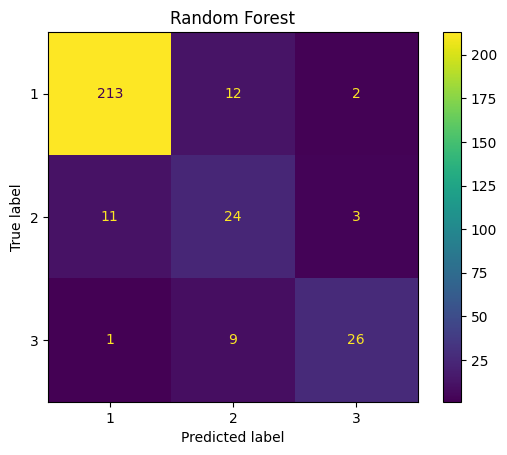

c:\Users\Kolawat\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


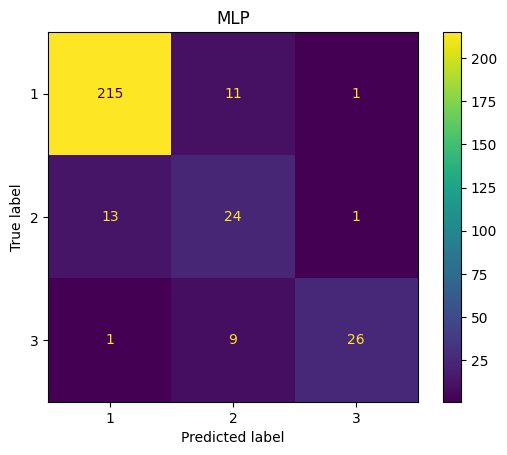

In [24]:
from sklearn.metrics import ConfusionMatrixDisplay
for model_name, model in best_params.items():
    if model_name == 'KNN':
        model = KNeighborsClassifier(n_neighbors=model['n_neighbors'])
    elif model_name == 'Decision Tree':
        model = DecisionTreeClassifier(criterion=model['criterion'], max_depth=model['max_depth'], max_features=model['max_features'], min_samples_leaf=model['min_samples_leaf'])
    elif model_name == 'Random Forest':
        model = RandomForestClassifier(criterion=model['criterion'], max_depth=model['max_depth'], max_features=model['max_features'], min_samples_leaf=model['min_samples_leaf'], n_estimators=model['n_estimators'])
    else:
        model = MLPClassifier(hidden_layer_sizes=model['hidden_layer_sizes'], max_iter=model['max_iter'])
    model.fit(X_train, Y_train.values.ravel())
    y_pred = model.predict(X_test)
    con_matrix = confusion_matrix(Y_test, y_pred)
    ConfusionMatrixDisplay(con_matrix, display_labels=[1,2,3]).plot()
    plt.title(f"{model_name}")
    plt.show()